### Objective: To train regression models for HIC classification with additional data
I was provided with more data. Here I am retraining some models. 

In [1]:
import mlflow
from mlflow.models import infer_signature

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, average_precision_score, roc_auc_score, accuracy_score, f1_score    
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, RepeatedKFold


from tqdm.notebook import tqdm
import tempfile

from developability.utils import ls
from developability.modeling import  *

## retina display
%config InlineBackend.figure_format = 'retina'

In [7]:
data  = "/Users/ChristopherRivera/Documents/DataResults/MPK190/Datasets/MPK190_descriptors_heparin_column_01-05-2024Train.pq" 
train = pd.read_parquet(data)



# apply the label
train['Label'] = (train['Hep RTT']>=1.0)*1

In [9]:
train.head()

,HCDR1_APBS_pos,HCDR1_APBS_neg,HCDR1_APBS_net,HCDR2_APBS_pos,HCDR2_APBS_neg,HCDR2_APBS_net,HCDR3_APBS_pos,HCDR3_APBS_neg,HCDR3_APBS_net,HFR1_APBS_pos,...,TOTAL_CDR_APBS_neg,TOTAL_CDR_APBS_net,TOTAL_FR_APBS_pos,TOTAL_FR_APBS_neg,TOTAL_FR_APBS_net,TOTAL_APBS_pos,TOTAL_APBS_neg,TOTAL_APBS_net,Hep RTT,Label
VIRMAB-ML-M190-R3-017,2101.454873,0.0,2101.454873,16211.958322,0.0,16211.958322,3535.700811,-684.330622,2851.370189,21187.446382,...,-2450.039596,32366.402500,83247.561314,-4779.101526,78468.459787,118064.003410,-7229.141122,110834.862287,1.005,1
VIRMAB-ML-M190-R2-098,1715.324587,0.0,1715.324587,14426.301758,0.0,14426.301758,2443.632930,-1228.604943,1215.027987,15102.993384,...,-5338.293721,23621.054972,63351.929988,-10446.373084,52905.556904,92311.278682,-15784.666805,76526.611876,0.939,0
VIRMAB-ML-M190-R3-062,1971.442657,0.0,1971.442657,15211.024526,0.0,15211.024526,2973.385571,-930.996096,2042.389475,16177.166359,...,-3207.808830,28896.033402,70673.782523,-6712.245382,63961.537141,102777.624756,-9920.054213,92857.570543,0.969,0
VIRMAB-ML-M190-R3-002,1801.413158,0.0,1801.413158,15147.691297,0.0,15147.691297,2892.583900,-848.311483,2044.272417,16160.428796,...,-2987.922170,28993.520238,71282.031021,-6623.799436,64658.231585,103263.473428,-9611.721606,93651.751822,0.963,0
VIRMAB-ML-M190-R2-112,1646.620766,0.0,1646.620766,14569.043954,0.0,14569.043954,2394.210533,-1192.732039,1201.478494,15115.131703,...,-5256.842756,23777.714375,64127.676999,-10580.641199,53547.035800,93162.234130,-15837.483955,77324.750175,0.931,0


### Function for training 

In [10]:
pos_cols = [col for col in df.columns if 'pos' in col and ('1' in col or '2' in col or '3' in col or '4' in col)]
net_cols = [col for col in df.columns if 'net' in col and ('1' in col or '2' in col or '3' in col or '4' in col)]

In [11]:
def train_gridsearch_mlflow(model,training_data, params, cols, scoring, n_splits=5, n_repeats = 10, regression=True, random_state = 42, model_name=None):
    """Train model with gridsearch and log results to mlflow"""        

    if not model_name: 
        if isinstance(model, Pipeline):
            model_name = model.steps[-1][1].__class__.__name__
        else:
            model_name = model.__class__.__name__
    

    with mlflow.start_run():
        mlflow.set_tag('model', model_name)
        mlflow.set_tag('cols', ', '.join(cols))
        mlflow.set_tag('scoring', scoring)
        
        if regression:
            X,y = training_data[cols], training_data['Hep RTT']
        else: 
            X,y = training_data[cols], training_data['Label']
        
        if regression: 
            cv = split_continous(X, y, n_splits=n_splits, n_repeats = n_repeats, random_state = random_state)
        else:
            cv = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=random_state)
        
        grid = GridSearchCV(model, params, scoring=scoring, cv=cv, 
                            n_jobs=-1, refit=scoring[0], verbose=1, return_train_score=True)
    
        grid.fit(X, y)


        if regression: 
            cv = split_continous(X, y, n_splits=n_splits, n_repeats = n_repeats, random_state = random_state)
        else:
            cv = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=random_state).split(X,y)
        
        mean_predictions, predictions_df = get_average_predictions(X,y, grid.best_estimator_, cv = cv, regression =regression)
        y_pred = mean_predictions['y_pred_mean']

        #log results to mlflow
        temp_path = tempfile.mkstemp(suffix=".csv")[1]
        predictions_df.to_csv(temp_path)    
        mlflow.log_artifact(temp_path, 'cv_predictions.csv')

        try: 
            fig,_ =plot_feature_importances(grid.best_estimator_, model_name=model_name)
            mlflow.log_figure(fig, 'feature_importances.png')
        except:
            pass
        
        if regression: 
            mlflow.log_metrics({'mean_cv_mse': mean_squared_error(y, y_pred),
                                'mean_cv_r2': r2_score(y, y_pred)})
            
            scores = extract_train_test_cv_scores(grid, scores=scoring, n_total=n_splits*n_repeats)
            mlflow.log_metrics(scores)

            fig,_= plot_regression_performance_from_predictions(y, y_pred, model_name=model_name)
            mlflow.log_figure(fig, 'prediction_error.png')

        else:
            mlflow.log_metrics({'roc_auc': roc_auc_score(y, y_pred), # 'roc_auc' for binary classification,
                                'precision_recall': average_precision_score(y, y_pred), # 'precision_recall' for binary classification
                                'accuracy': accuracy_score(y, (y_pred>0.5)),
                                'f1': f1_score(y,  (y_pred>0.5))})
            
            fig, _ = plot_classification_performance_from_predictions(y, y_pred, model_name=model_name)
            mlflow.log_figure(fig, 'classification_performance.png')
            
            scores = extract_train_test_cv_scores(grid, scores=scoring, n_total=n_splits*n_repeats)
            mlflow.log_metrics(scores)
            
        
        mlflow.log_params(grid.best_params_)
        try:
            mlflow.log_params(grid.cv_results_)
        except:
            pass

        signature = infer_signature(X, y)
        mlflow.sklearn.log_model(grid.best_estimator_, 'model', signature=signature)
        
        return grid.best_estimator_, grid.best_params_, grid.best_score_

In [12]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("HeparinClassificationExperiments1")

2024/01/08 12:41:53 INFO mlflow.tracking.fluent: Experiment with name 'HeparinClassificationExperiments1' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/194694202737025869', creation_time=1704746513254, experiment_id='194694202737025869', last_update_time=1704746513254, lifecycle_stage='active', name='HeparinClassificationExperiments1', tags={}>

### Logistic Regression with L1, L2, and Elasticnet regularization

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None


Fitting 50 folds for each of 9 candidates, totalling 450 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

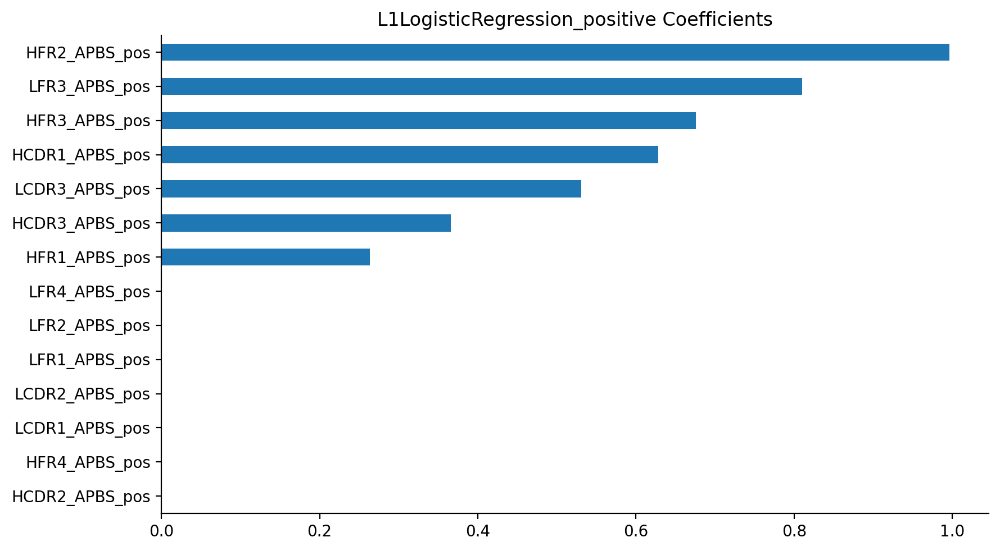

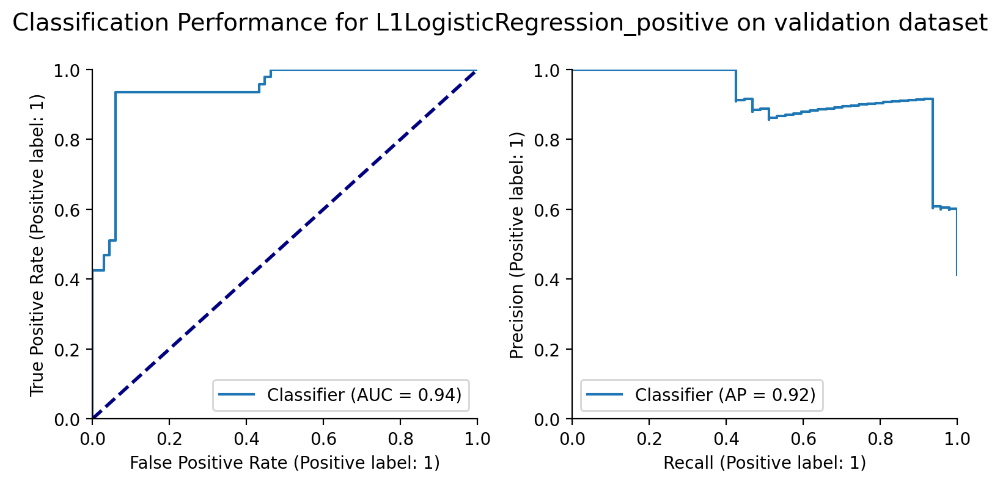

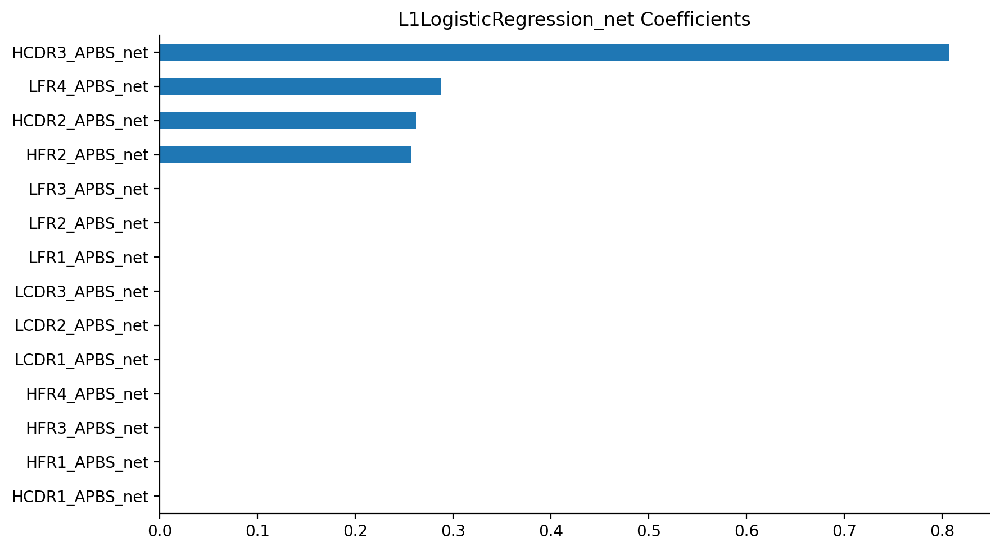

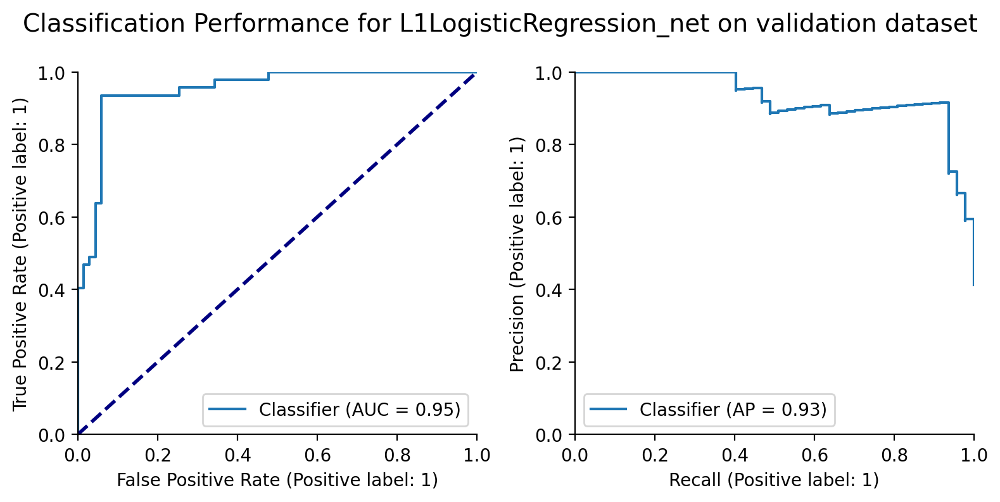

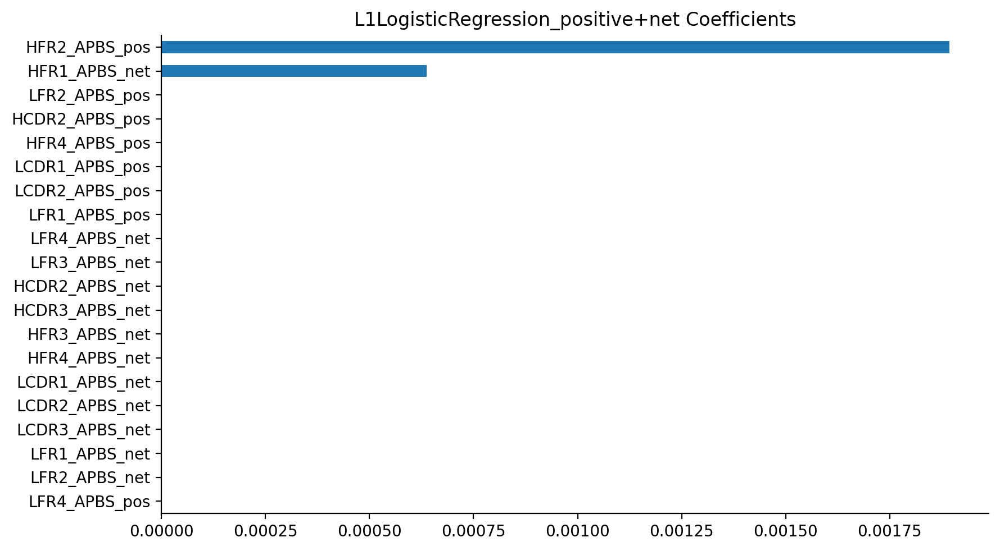

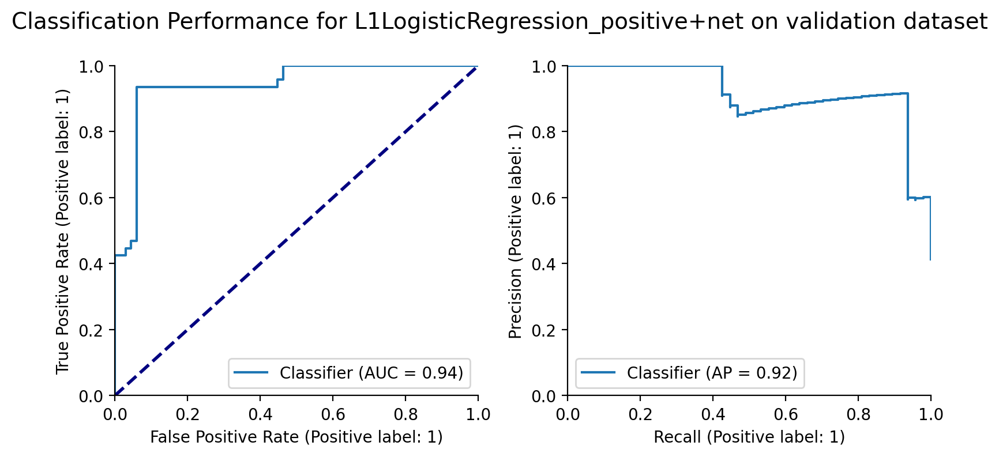

In [14]:
scoring = ['roc_auc', 'average_precision', 'accuracy', 'f1']

l1_logistic = LogisticRegression(penalty='l1', solver='liblinear', max_iter=1000)
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('l1_logistic', l1_logistic)])
params = {'l1_logistic__C': np.logspace(-4, 4, 9)}
model='L1LogisticRegression'
training_data = train

feature_subsets = {'positive': pos_cols, 'net':  net_cols, 'positive+net':pos_cols+net_cols}
for col_name, cols in tqdm(feature_subsets.items()):
    model_name = f'{model}_{col_name}'
    best_model, best_params, score = train_gridsearch_mlflow(pipe,training_data, params=params, cols=cols, scoring=scoring, regression=False, model_name=model_name)


  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 9 candidates, totalling 450 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

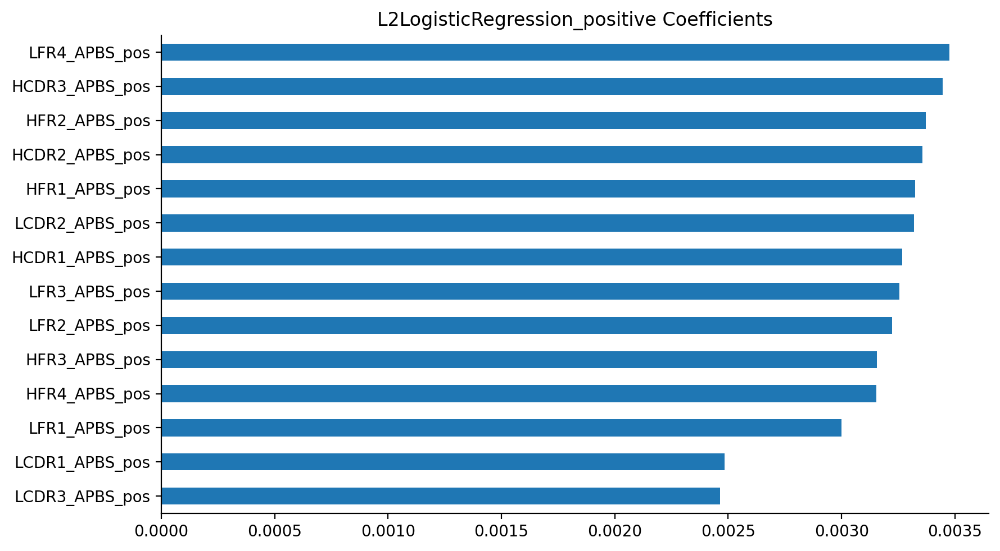

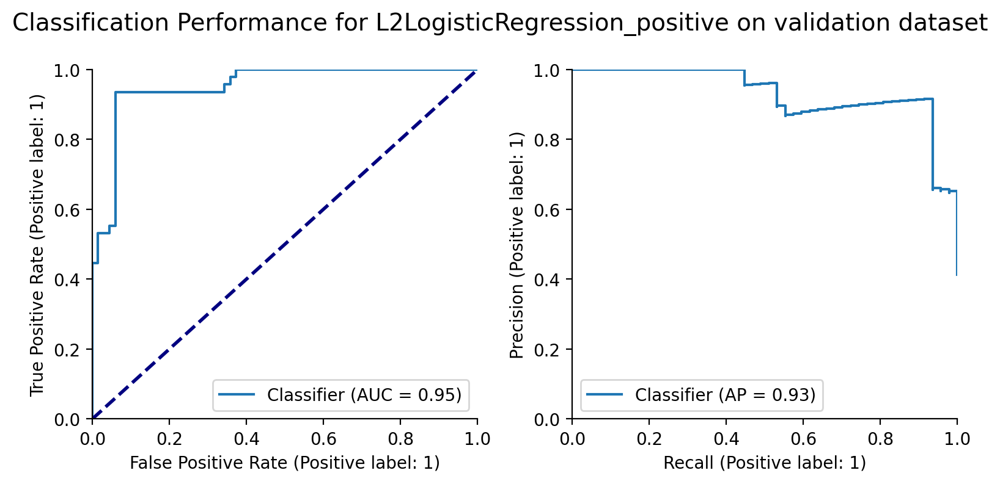

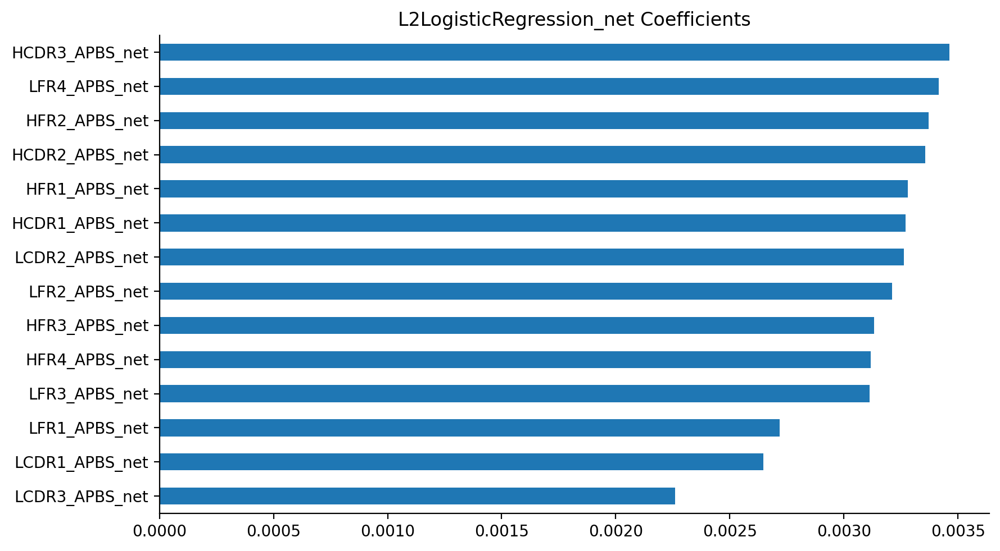

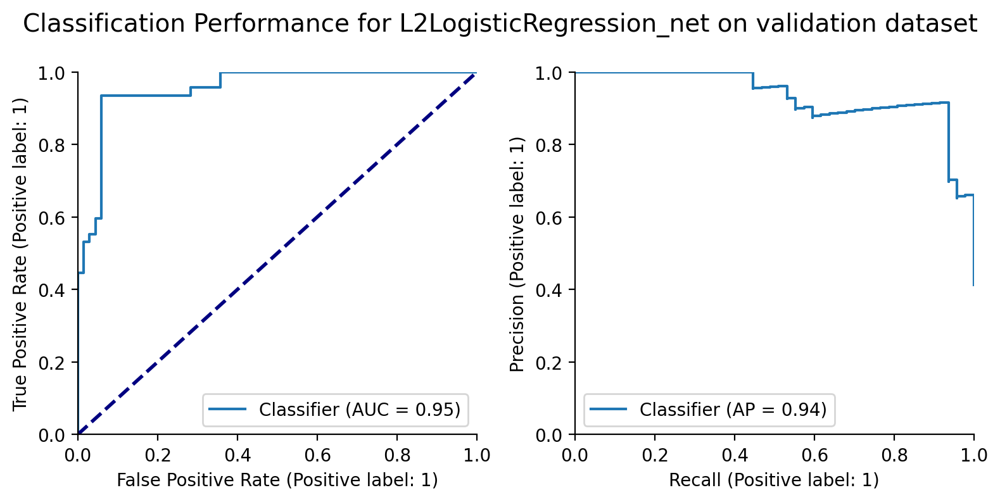

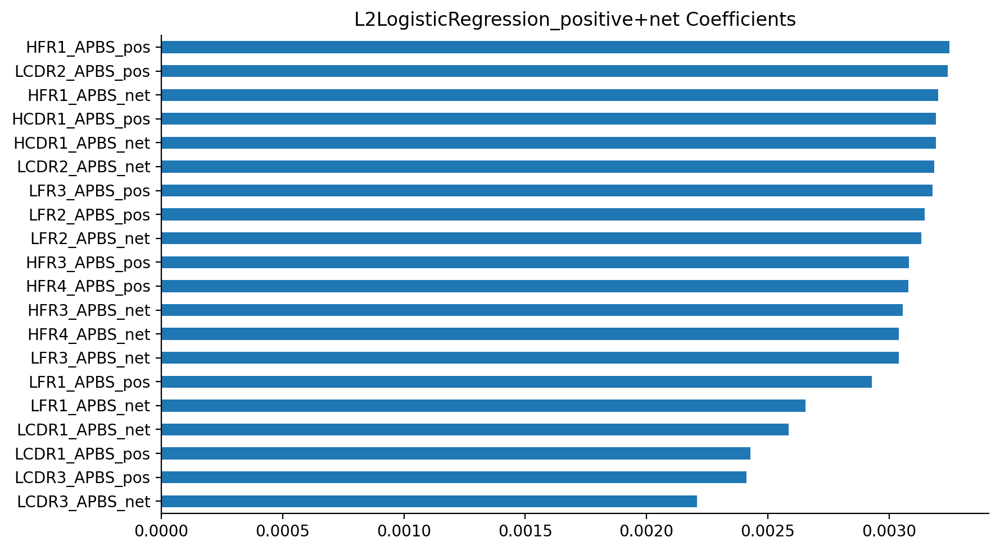

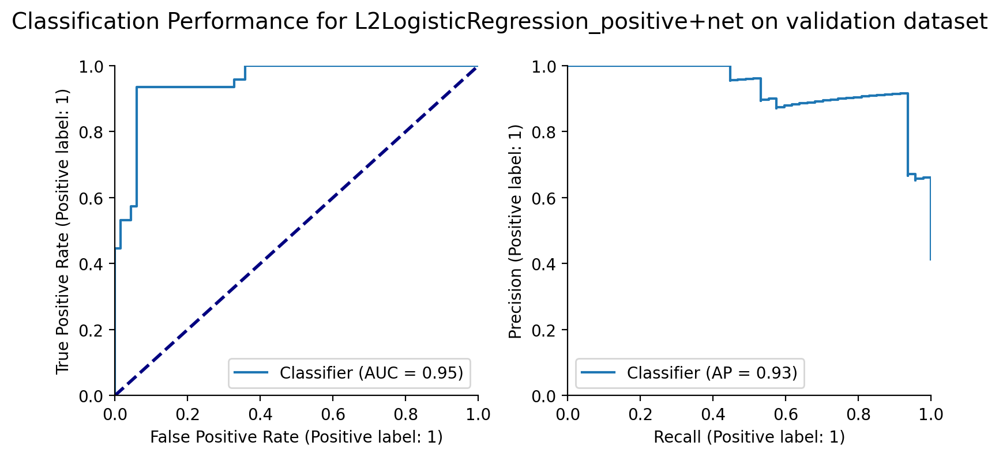

In [15]:
l2_logistic = LogisticRegression(penalty='l2', solver='liblinear', max_iter=1000)
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('l2_logistic', l2_logistic)])
params = {'l2_logistic__C': np.logspace(-4, 4, 9)}
model='L2LogisticRegression'
training_data = train

for col_name, cols in tqdm(feature_subsets.items()):
    model_name = f'{model}_{col_name}'
    best_model, best_params, score = train_gridsearch_mlflow(pipe,training_data, params=params, cols=cols, scoring=scoring, regression=False, model_name=model_name)


  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 50 folds for each of 27 candidates, totalling 1350 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was

Fitting 50 folds for each of 27 candidates, totalling 1350 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was

Fitting 50 folds for each of 27 candidates, totalling 1350 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was

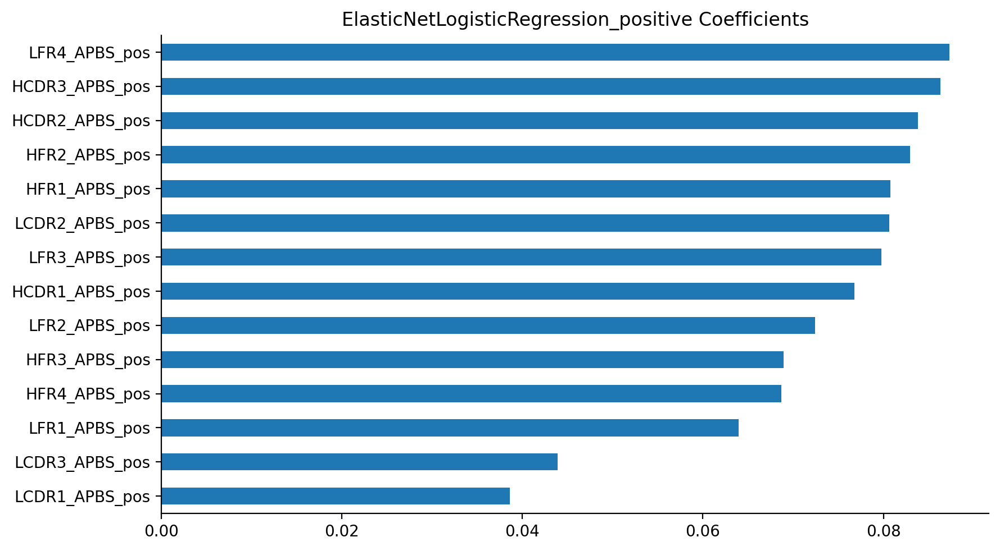

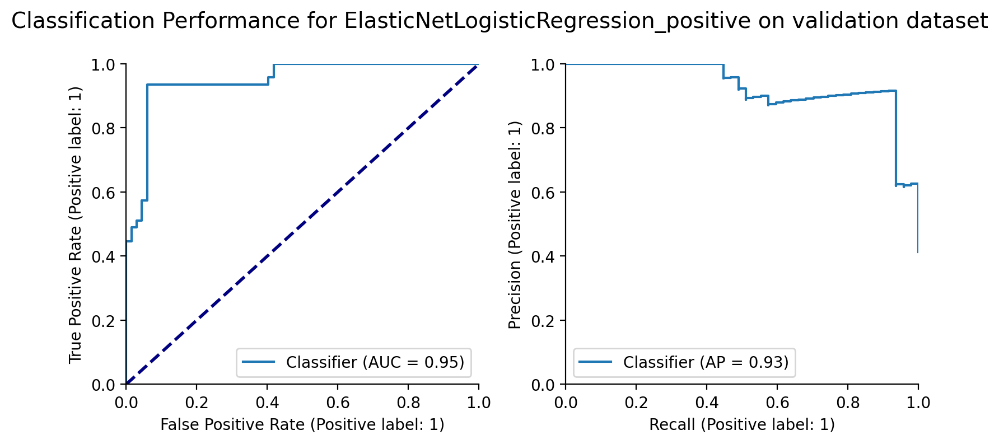

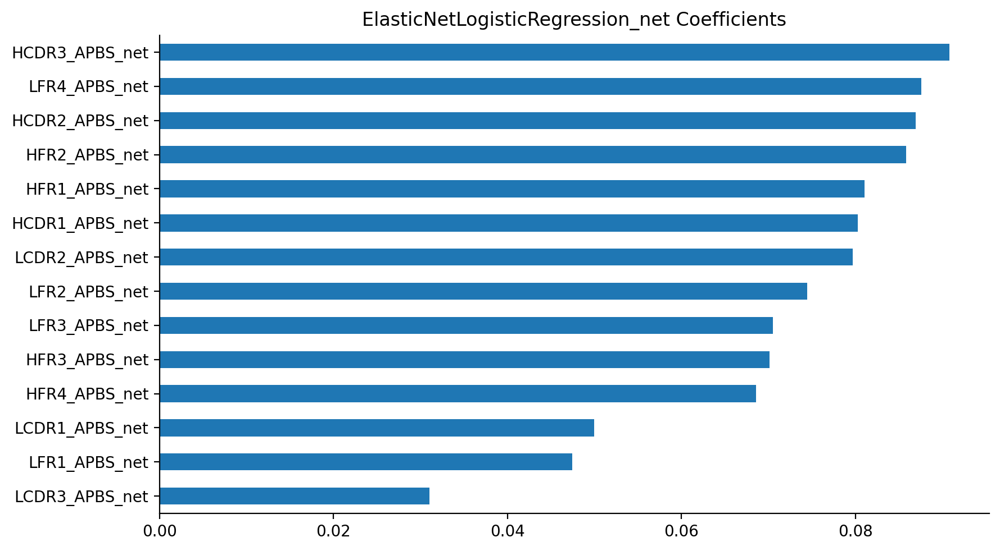

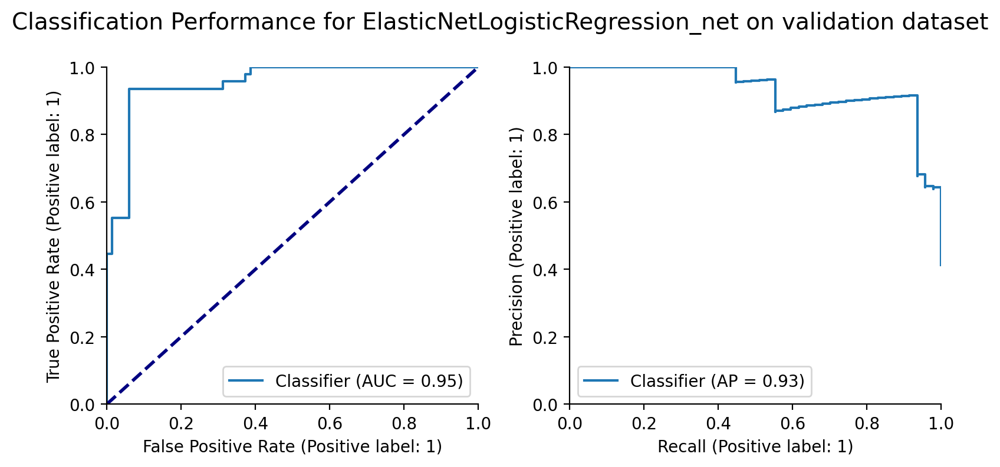

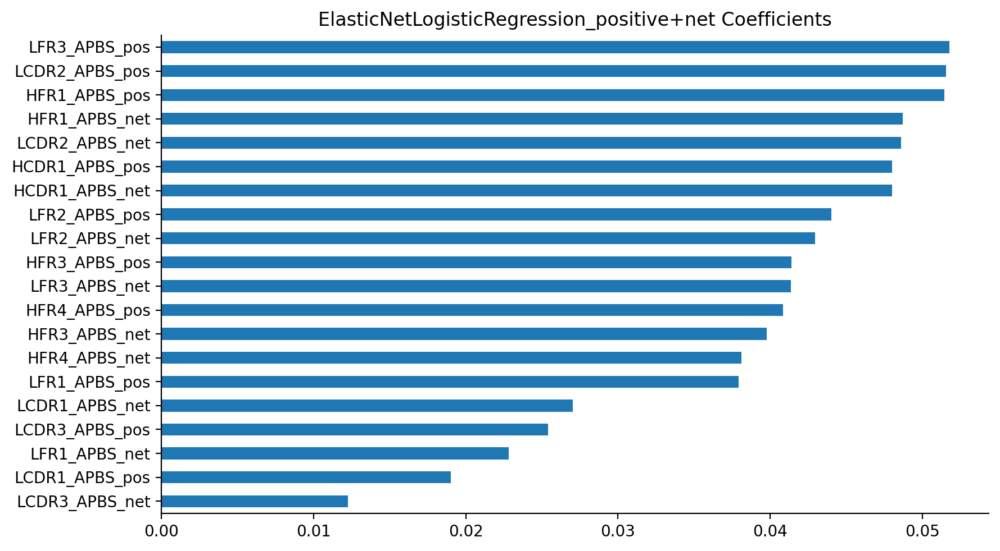

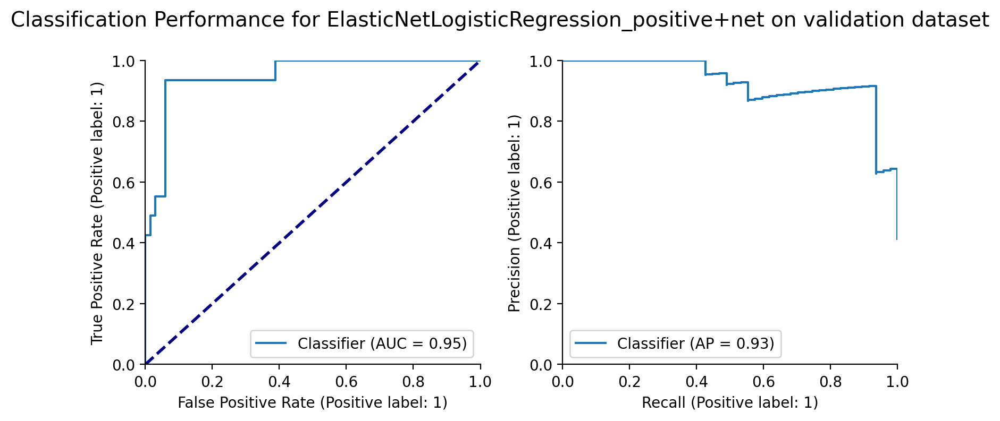

In [16]:
ElasticNet_logistic = LogisticRegression(penalty='elasticnet', solver='saga', max_iter=5000)
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('ElasticNet_logistic', ElasticNet_logistic)])
params = {'ElasticNet_logistic__C': np.logspace(-4, 4, 9), 'ElasticNet_logistic__l1_ratio': [0.1, 0.5, 0.9]}
model='ElasticNetLogisticRegression'
training_data = train

for col_name, cols in tqdm(feature_subsets.items()):
    model_name = f'{model}_{col_name}'
    best_model, best_params, score = train_gridsearch_mlflow(pipe,training_data, params=params, cols=cols, scoring=scoring, regression=False, model_name=model_name)


### Random Forest 

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 50 folds for each of 18 candidates, totalling 900 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 18 candidates, totalling 900 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 18 candidates, totalling 900 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

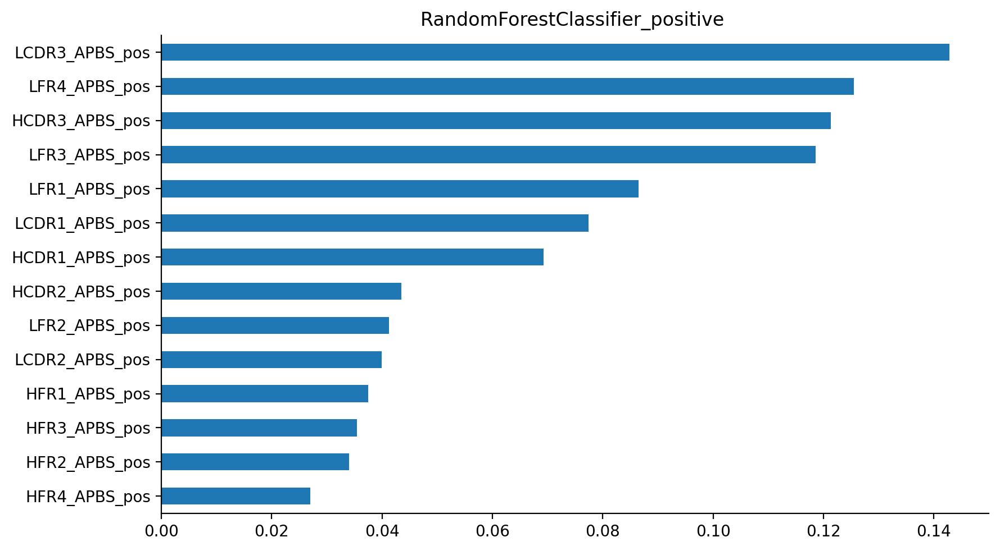

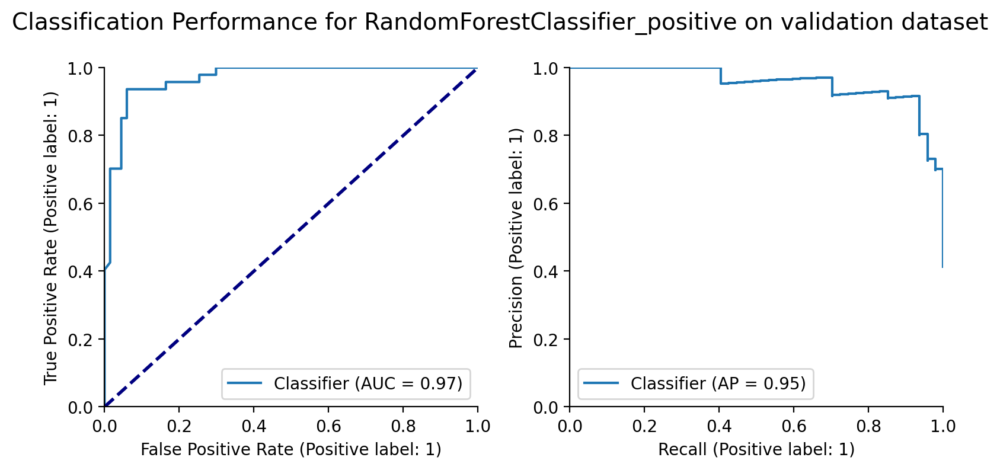

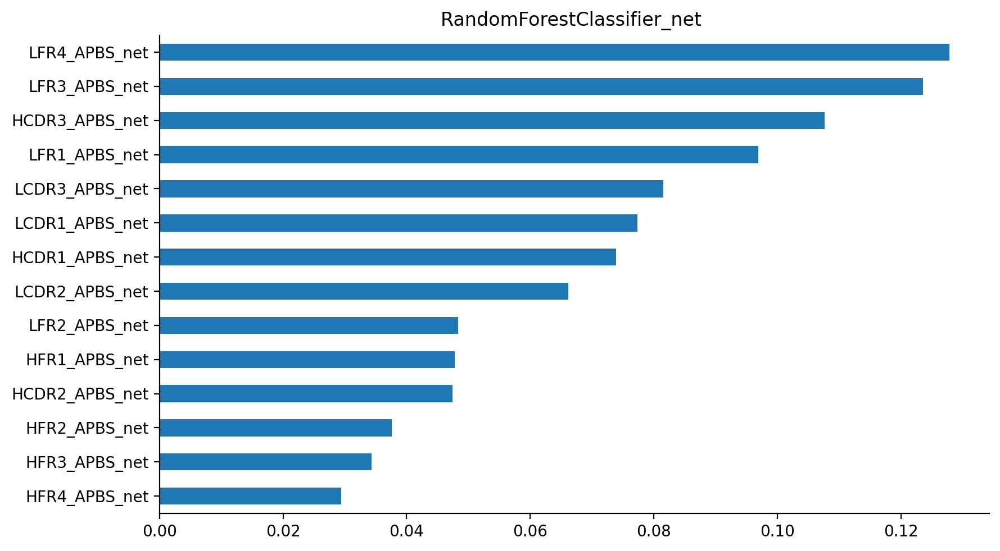

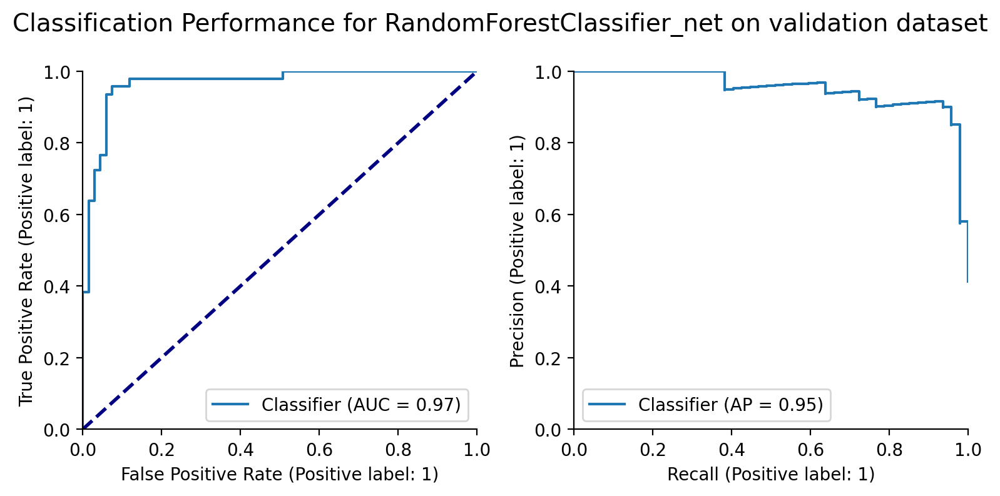

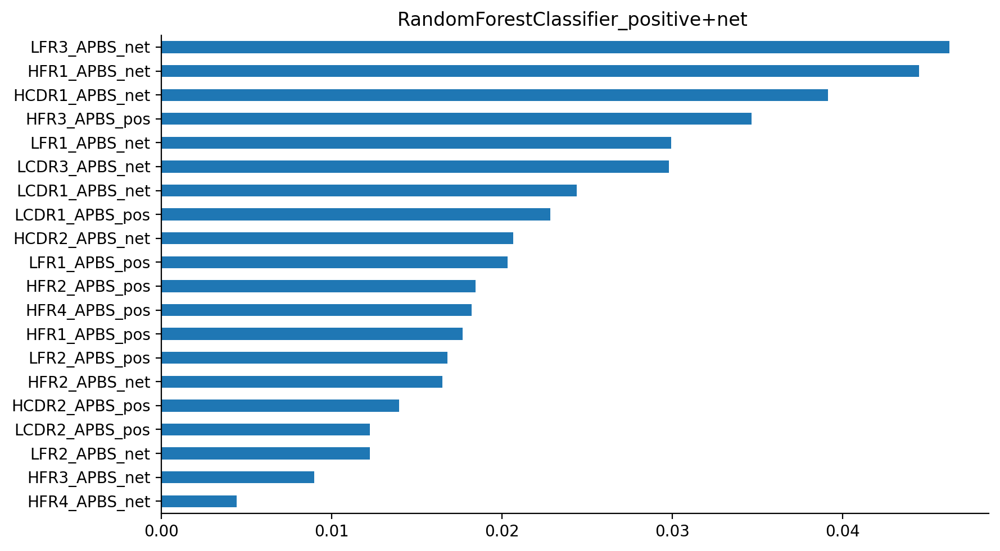

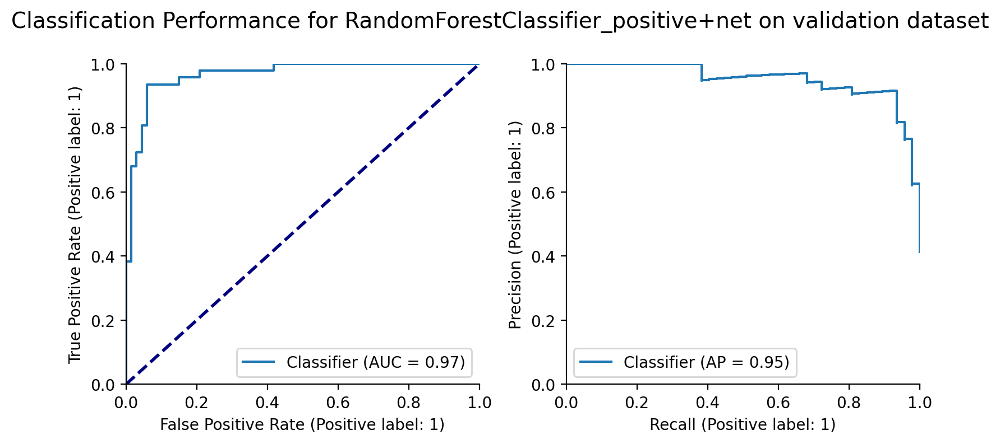

In [17]:
rf = RandomForestClassifier(random_state=42)
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('random_forest', rf)])
params = {'random_forest__n_estimators': [10, 100, 200], 'random_forest__max_depth': [3,5,7], 'random_forest__max_features': ['sqrt', 'log2']}
model='RandomForestClassifier'
training_data = train

for col_name, cols in tqdm(feature_subsets.items()):
    model_name = f'{model}_{col_name}'
    best_model, best_params, score = train_gridsearch_mlflow(pipe,training_data, params=params, cols=cols, scoring=scoring, regression=False, model_name=model_name)


#### Extra Trees

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 50 folds for each of 18 candidates, totalling 900 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 18 candidates, totalling 900 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 18 candidates, totalling 900 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

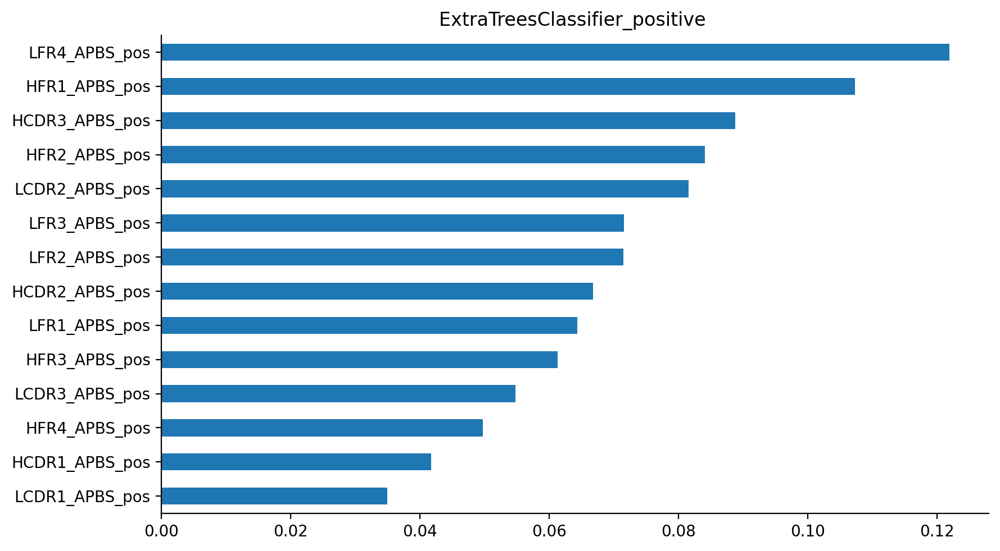

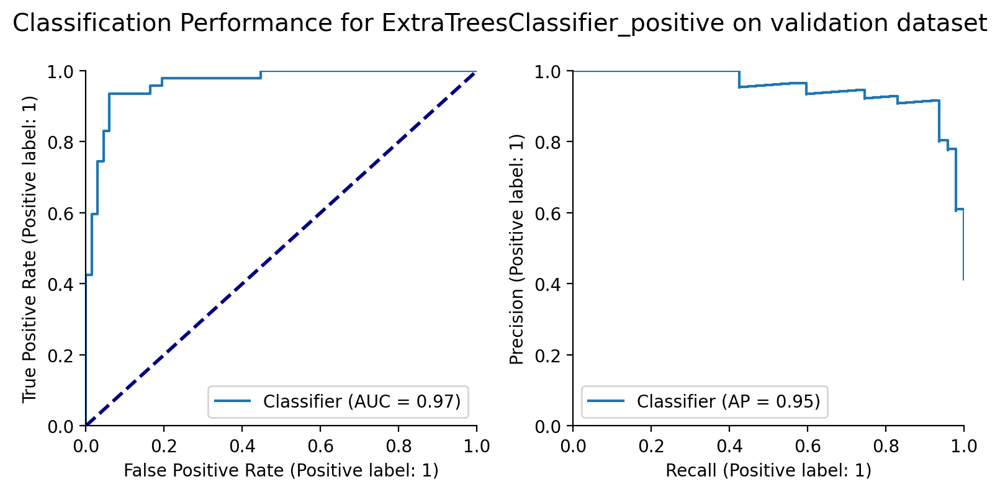

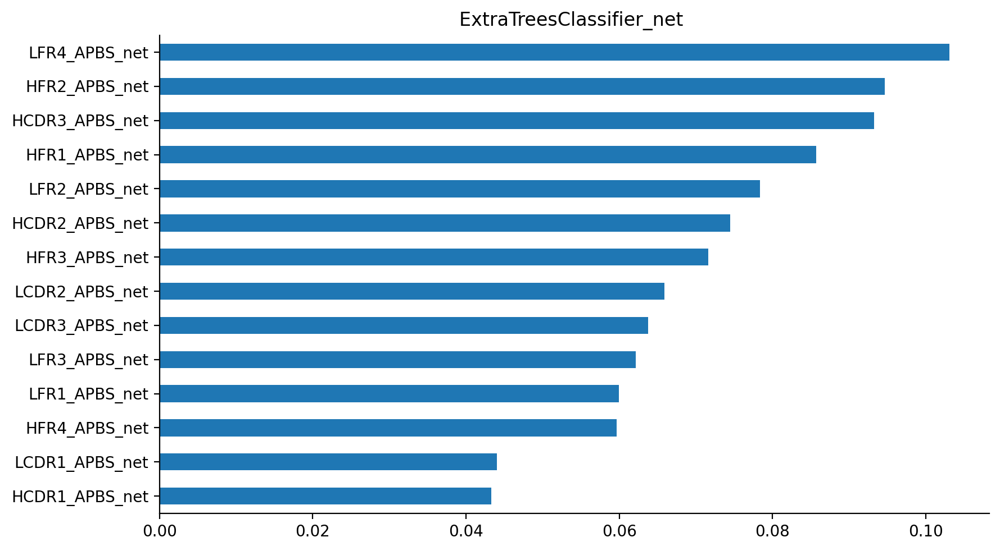

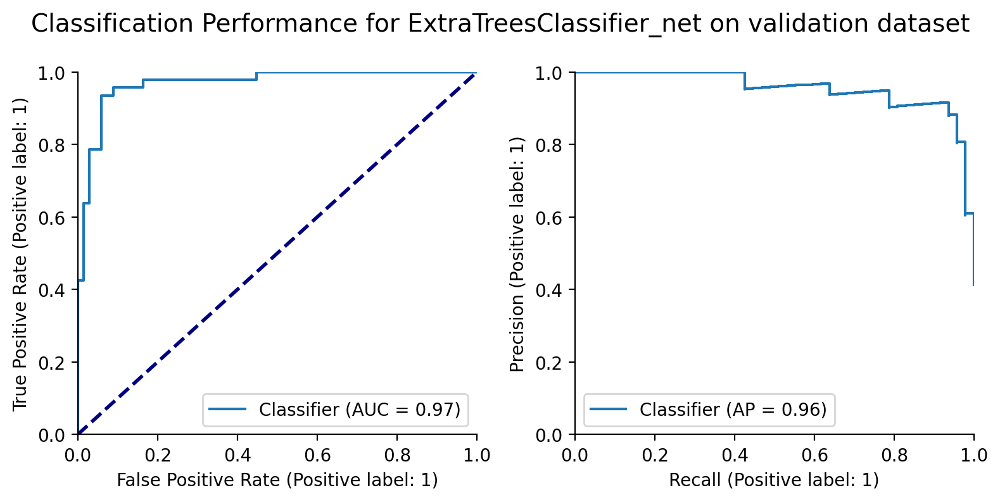

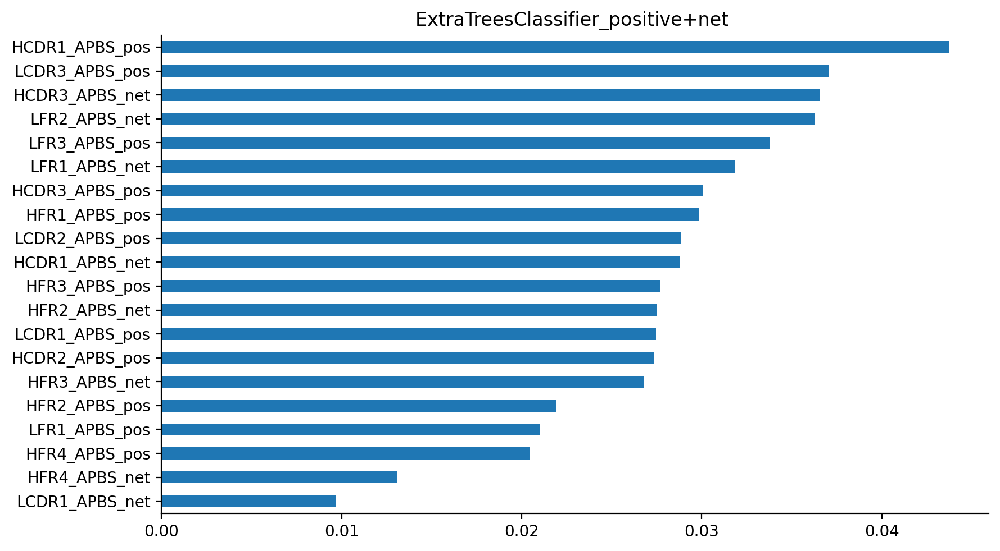

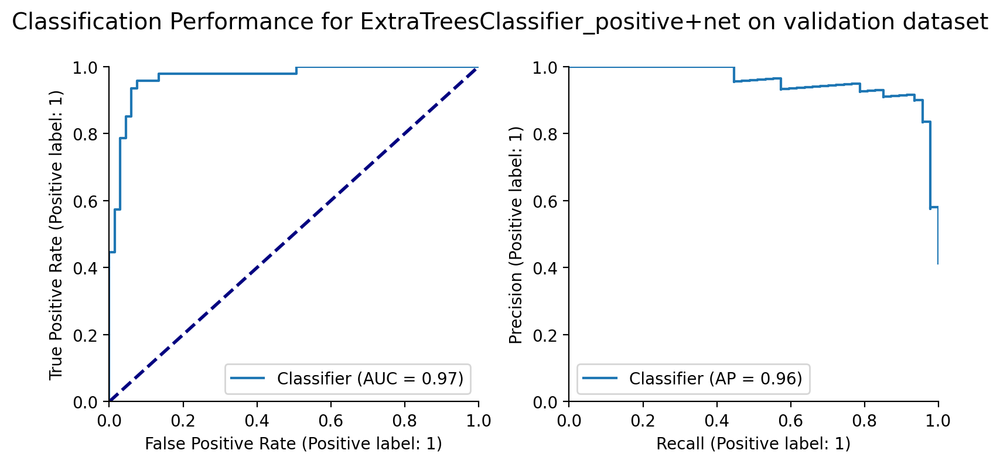

In [18]:
extra_trees = ExtraTreesClassifier(random_state=42)
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('extra_trees', extra_trees)])
params = {'extra_trees__n_estimators': [10, 100, 200], 'extra_trees__max_depth': [3,5,7], 'extra_trees__max_features': ['sqrt', 'log2']}
model='ExtraTreesClassifier'
training_data = train

for col_name, cols in tqdm(feature_subsets.items()):
    model_name = f'{model}_{col_name}'
    best_model, best_params, score = train_gridsearch_mlflow(pipe,training_data, params=params, cols=cols, scoring=scoring, regression=False, model_name=model_name)


### Individual Features with Logistic Regressor

  0%|          | 0/70 [00:00<?, ?it/s]

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/Projects/developability/developability/modeling.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(8, 6))
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns a

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

Fitting 50 folds for each of 1 candidates, totalling 50 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/mlflow/models/signature.py:213: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  outputs = _infer_schema(model_output) if model_output is not None else None
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was importe

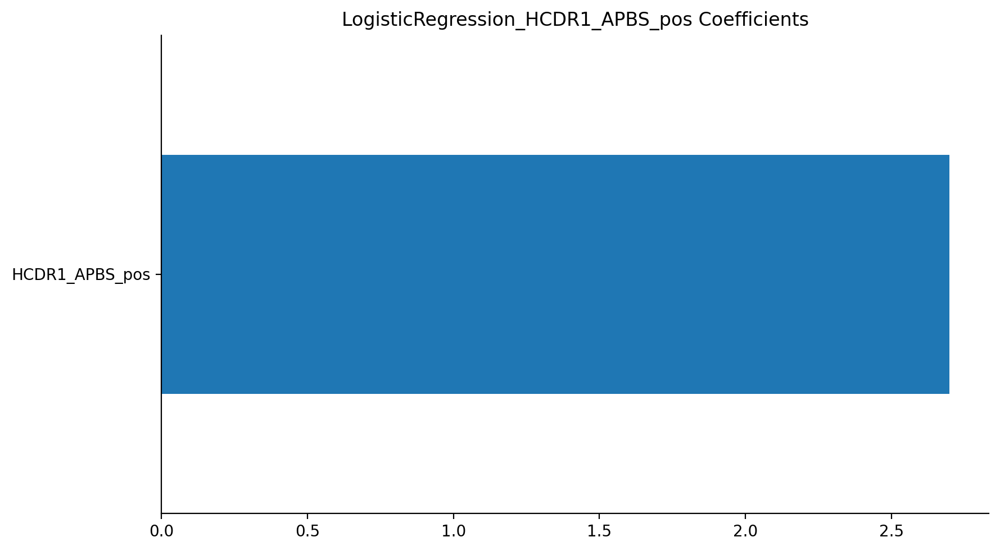

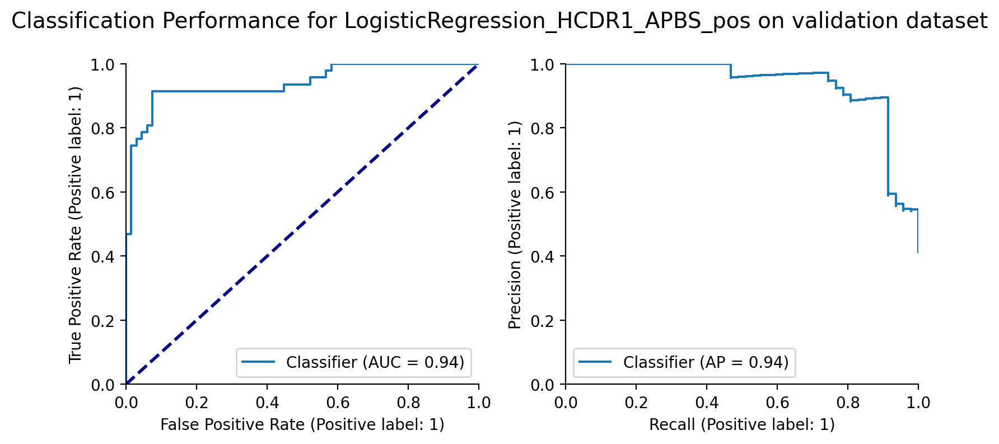

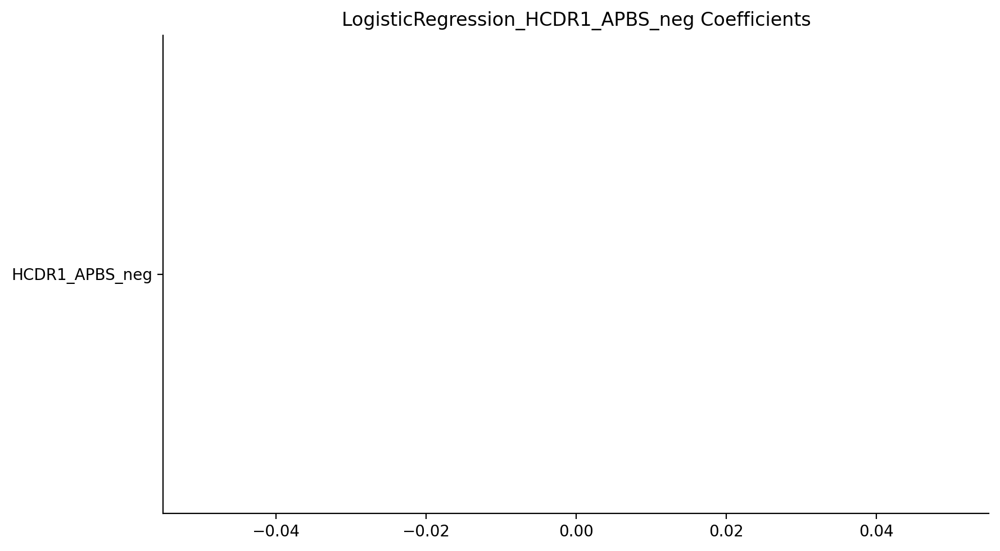

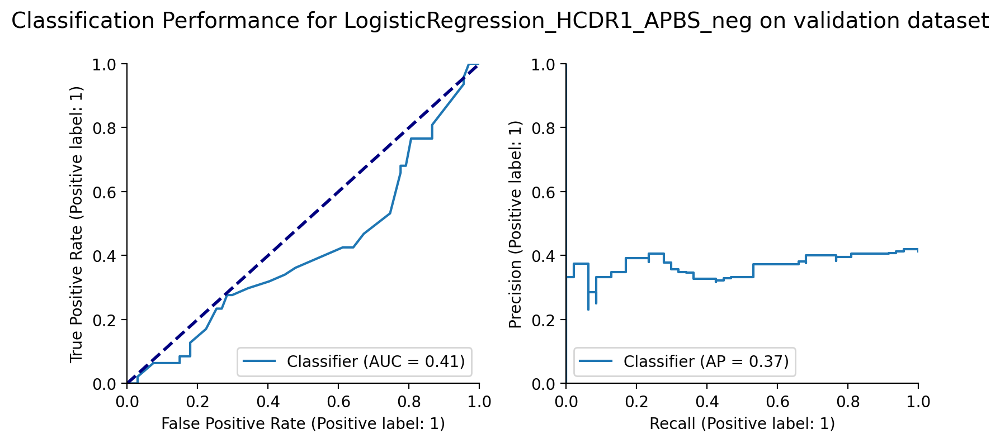

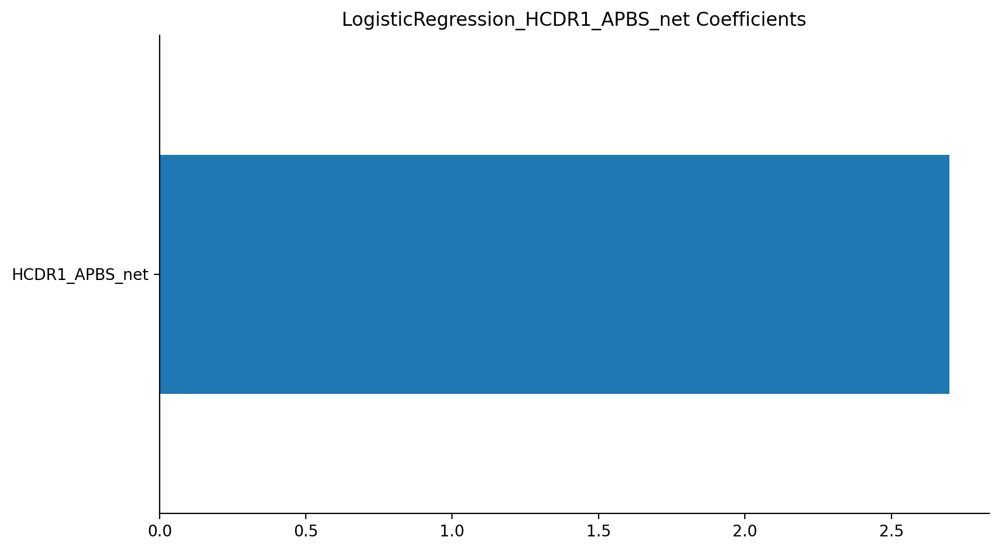

...

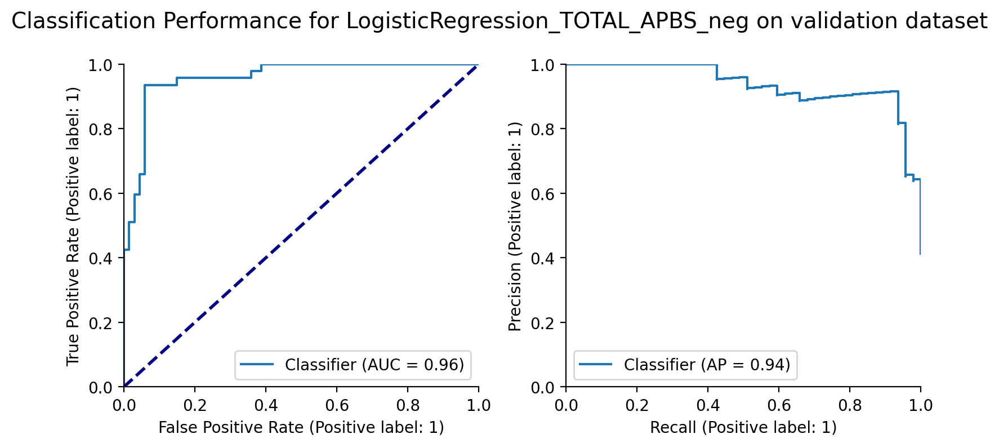

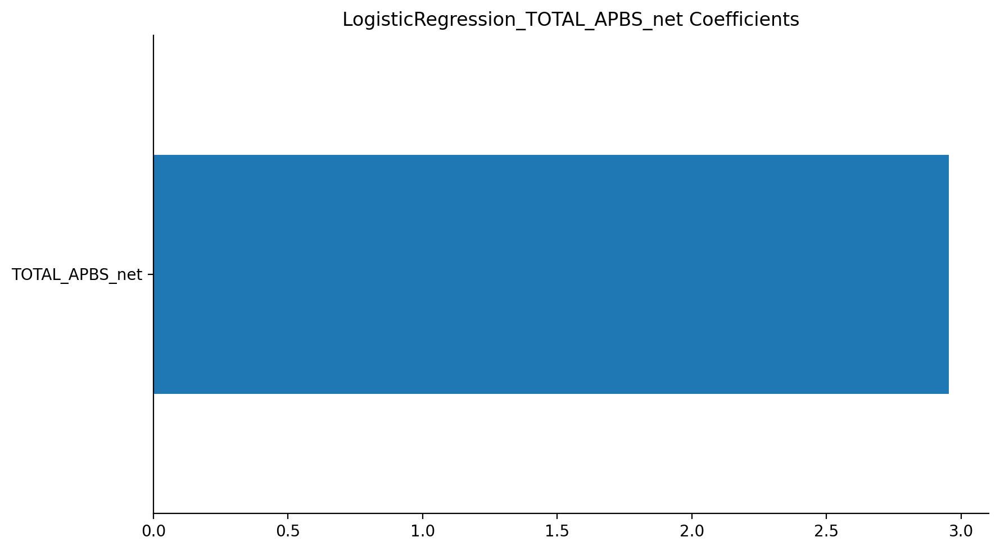

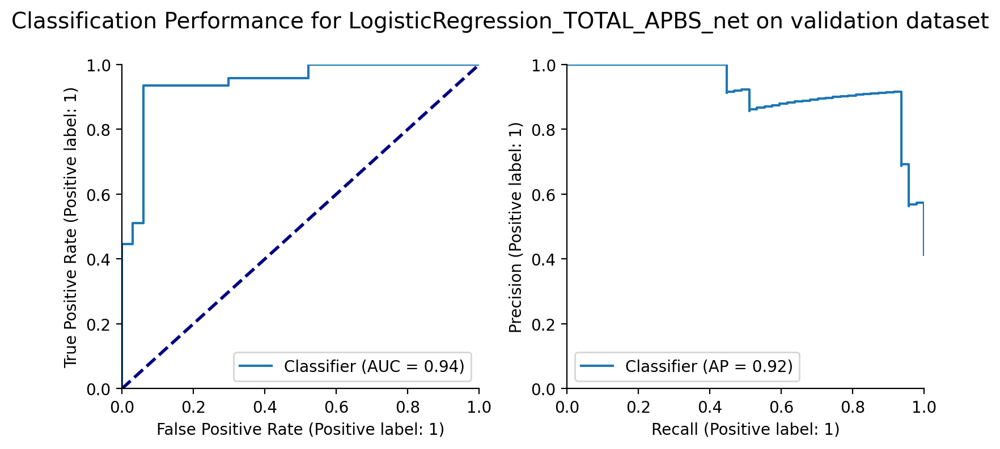

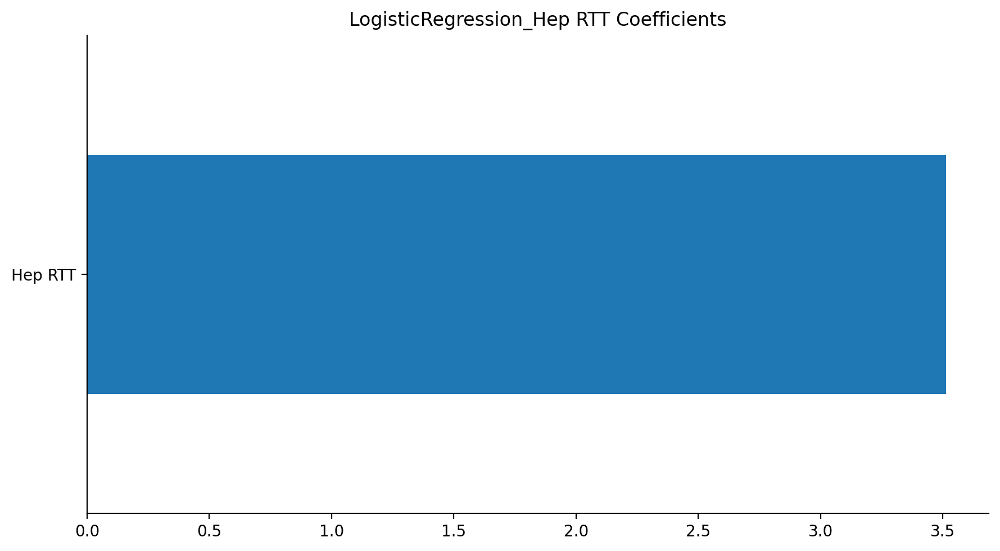

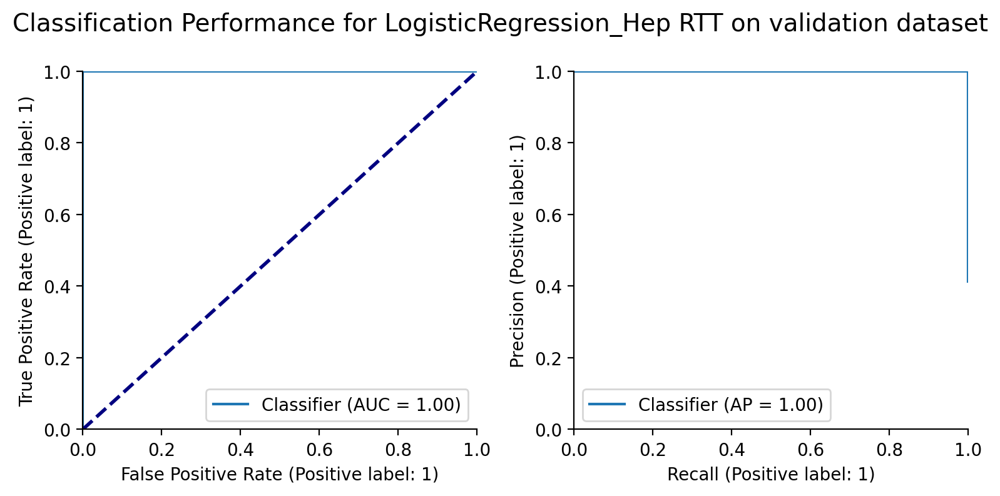

In [20]:
lr = LogisticRegression()
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('lr', lr)])
params = {}
training_data = train
model = 'LogisticRegression'
for col in tqdm(train.columns[:-1]):
    model_name = f'{model}_{col}'
    cols = [col]
    best_model, best_params, score = train_gridsearch_mlflow(pipe,training_data, params=params, cols=cols, scoring=scoring, regression=False, model_name=model_name)


### Remarks: 
These look good. It seems that the RandomForest is now dominating. 